In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cygnus_lib as cy
import mylib as my
from scipy.optimize import curve_fit
from scipy.stats import chisquare
import scipy.stats as stats
from itertools import combinations
import math
%matplotlib inline
x_resolution = y_resolution = 2048

In [255]:
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms
def confidence_ellipse_par(x, y):
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)

    if np.sqrt(cov[0, 0] * cov[1, 1]) == 0:
        width = height = -1
    else:
        pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
        # Using a special case to obtain the eigenvalues of this
        # two-dimensionl dataset.

        ell_radius_x = np.sqrt(1 + pearson)
        ell_radius_y = np.sqrt(1 - pearson)
        width=ell_radius_x * 2
        height=ell_radius_y * 2
    return width, height
def confidence_ellipse(x, y, ax, n_std=3.0, facecolor='none', **kwargs):
    """
    Create a plot of the covariance confidence ellipse of `x` and `y`

    Parameters
    ----------
    x, y : array_like, shape (n, )
        Input data.

    ax : matplotlib.axes.Axes
        The axes object to draw the ellipse into.

    n_std : float
        The number of standard deviations to determine the ellipse's radiuses.

    Returns
    -------
    matplotlib.patches.Ellipse

    Other parameters
    ----------------
    kwargs : `~matplotlib.patches.Patch` properties
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensionl dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0),
        width=ell_radius_x * 2,
        height=ell_radius_y * 2,
        facecolor=facecolor,
        **kwargs)

    # Calculating the stdandard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    # calculating the stdandard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)

    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)
    #print (ellipse, transf)
    return ax.add_patch(ellipse), ellipse


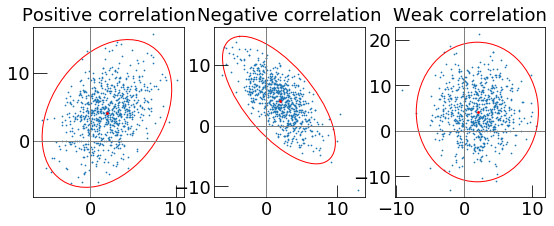

In [256]:
def get_correlated_dataset(n, dependency, mu, scale):
    latent = np.random.randn(n, 2)
    dependent = latent.dot(dependency)
    scaled = dependent * scale
    scaled_with_offset = scaled + mu
    # return x and y of the new, correlated dataset
    return scaled_with_offset[:, 0], scaled_with_offset[:, 1]
np.random.seed(0)

PARAMETERS = {
    'Positive correlation': np.array([[0.85, 0.35],
                                      [0.15, -0.65]]),
    'Negative correlation': np.array([[0.9, -0.4],
                                      [0.1, -0.6]]),
    'Weak correlation': np.array([[1, 0],
                                  [0, 1]]),
}

mu = 2, 4
scale = 3, 5

fig, axs = plt.subplots(1, 3, figsize=(9, 3))
for ax, (title, dependency) in zip(axs, PARAMETERS.items()):
    x, y = get_correlated_dataset(800, dependency, mu, scale)
    ax.scatter(x, y, s=0.5)

    ax.axvline(c='grey', lw=1)
    ax.axhline(c='grey', lw=1)

    confidence_ellipse(x, y, ax, edgecolor='red')

    ax.scatter(mu[0], mu[1], c='red', s=3)
    ax.set_title(title)

plt.show()

# LEMON Parameters

In [307]:

# LEMON
phKev       = 1169/5.9 # @ 450 --> 930/5.9 a 440
pixelscale  = 0.125 # lemonn mm/pixel
nsigma      = 1
run         = 1511
cimax       = 300
cimin       = 95 
rebin_th_image = 116 # 116
dataSelection = 'LAB'
rescale = 512




# ORANGE Parameter

In [ ]:

# ORANGE #########################
phKev       = 12000/5.9 # @ 440 
pixelscale  = 55e-3     # mm/pixel
nsigma      = 1
dataSelection = 'LAB'
###########
run         = 340       # Fe   @440 
run         = 722       # Co60 @440
rebin_th_image = 101 
###########
run         = 494       # AmBe @440
rebin_th_image = 105 
#run         = 497       # cosmici


###########
cimax       = 300
cimin       = 95

############
rescale = 256


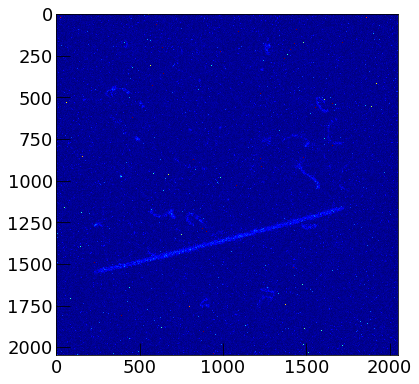

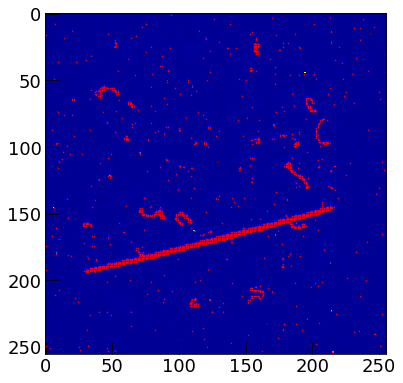

In [308]:
cy.set_atlas_style('square')
# show immage
iTr     = 1
image = cy.swift_read_image_h5(cy.imageFile2FullPathCygnus(dataSelection, run, iTr))
plt.imshow(image, vmin=cimin,vmax=cimax, cmap='jet')
th_image = image
plt.show()
rebin_image     = cy.rebin(image, (rescale, rescale))

plt.imshow(rebin_image, vmin=cimin,vmax=cimax, cmap='jet')
edges           = (rebin_image > rebin_th_image) & (rebin_image < cimax)         
points          = np.array(np.nonzero(edges)).T.astype(float) 
plt.plot(points[:,1], points[:,0], 'r.', markersize=1)
plt.show()

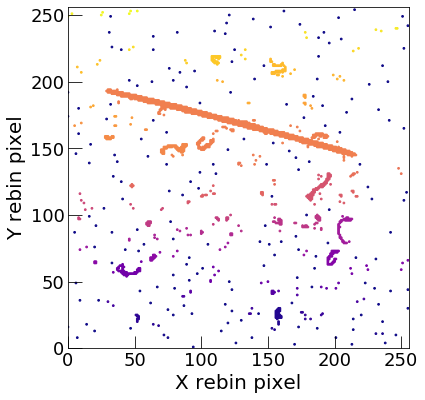

85 14.166666666666666 15 6


/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


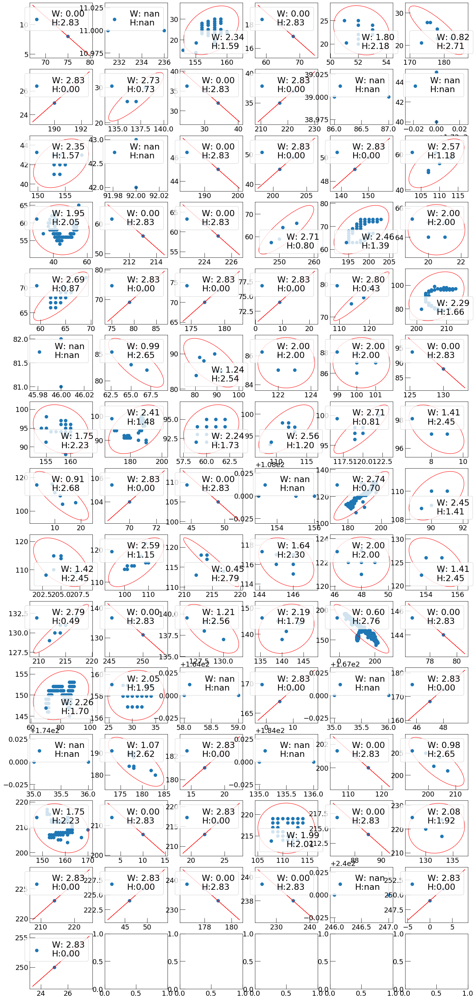

In [309]:
from matplotlib import patches
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
#####################################################
scaler = StandardScaler()
X_scaled = scaler.fit_transform(points)

dbscan = DBSCAN(eps=0.1, min_samples = 2) # eps=0.1
dbscan.fit(points)

clusters = dbscan.fit_predict(X_scaled)
plt.scatter(points[:,1], points[:,0], s=3, c=dbscan.labels_, cmap="plasma")
plt.xlabel("X rebin pixel")
plt.ylabel("Y rebin pixel")
plt.xlim(0,rebin_image.shape[0])
plt.ylim(0,rebin_image.shape[1])
plt.show()

for i in range (min(dbscan.labels_), max(dbscan.labels_)):
    ph = 0
    for j in range(0, len(points[:,1][dbscan.labels_==i])):
        ph += (rebin_image[int(points[j,1]), int(points[j,0])])
    #print(i,np.sum([dbscan.labels_==i]), ph, ph/np.sum([dbscan.labels_==i]))

n_cluster = max(dbscan.labels_)
h_plot = 6
l_plot    = math.ceil(n_cluster/h_plot)

print (n_cluster,n_cluster/h_plot, l_plot, h_plot) 
fig, ax = plt.subplots(l_plot, h_plot, figsize=(20, l_plot*3))
h_plot_i    = 0
l_plot_i    = 0
for ic in range(0, n_cluster):
    el_plt, el_par = confidence_ellipse(points[:,1][dbscan.labels_==ic], points[:,0][dbscan.labels_==ic], 
                                        ax[l_plot_i, h_plot_i], edgecolor='red')
    ax[l_plot_i, h_plot_i].scatter(points[:,1][dbscan.labels_==ic], points[:,0][dbscan.labels_==ic], 
                                   label = ('W: %.2f\nH:%.2f' %(el_par.width,el_par.height)))
    width, height = confidence_ellipse_par(points[:,1][dbscan.labels_==ic], points[:,0][dbscan.labels_==ic])
    ax[l_plot_i, h_plot_i].legend()
    if (h_plot_i==h_plot-1):
        h_plot_i = 0
        l_plot_i +=1
    else:
        h_plot_i +=1
plt.show()

0.0 2.8284271247461903
73.5 9.0 1.5 1.0 -0.5880026035475675


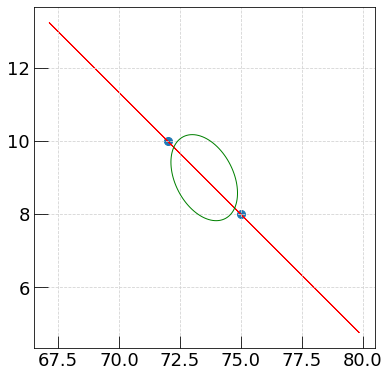

In [310]:
# show a single cluster
ic = 0
fig, ax = plt.subplots()
ax.scatter(points[:,1][dbscan.labels_==ic], points[:,0][dbscan.labels_==ic])
x0, y0, a, b, theta = cluster_elips(points[dbscan.labels_==ic])
confidence_ellipse(points[:,1][dbscan.labels_==ic], points[:,0][dbscan.labels_==ic], ax, edgecolor='red')
width, height = confidence_ellipse_par(points[:,1][dbscan.labels_==ic], points[:,0][dbscan.labels_==ic])
print(width, height)
t = np.linspace(0, 2*np.pi, 100)
print (x0, y0, a, b, theta)
plt.plot(x0 + a*np.cos(t)*np.cos(theta) - b*np.sin(t)*np.sin(theta) , 
         y0 + b*np.sin(t)*np.cos(theta) + a*np.cos(t)*np.sin(theta), 'g-')
plt.grid(color='lightgray',linestyle='--')

plt.show()

Numbero of immage: 300
Event: 0
[0, -1, 164, 16344.921875, 99.66415777439025, 1, 94, 254, 215, 1.9953186214109113, 2.004670446495099]


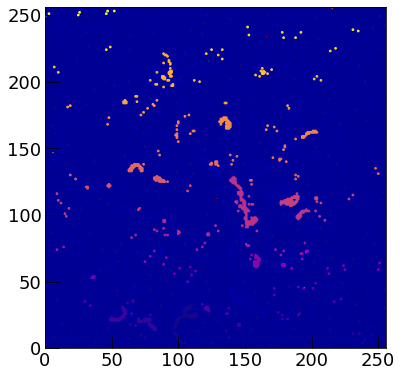

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


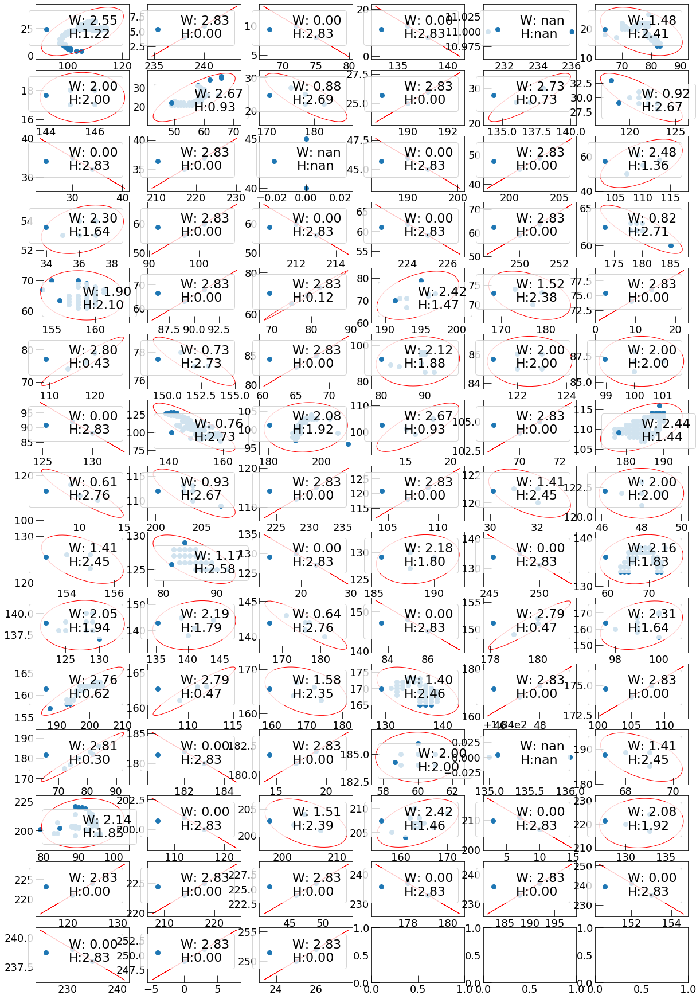

Event: 20
[0, 19, 2, 199.546875, 99.7734375, 56, 97, 60, 101, 2.8284271247461903, 0.0]


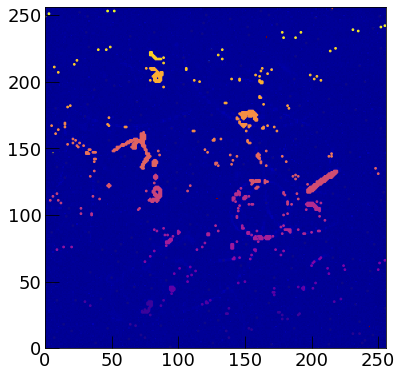

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


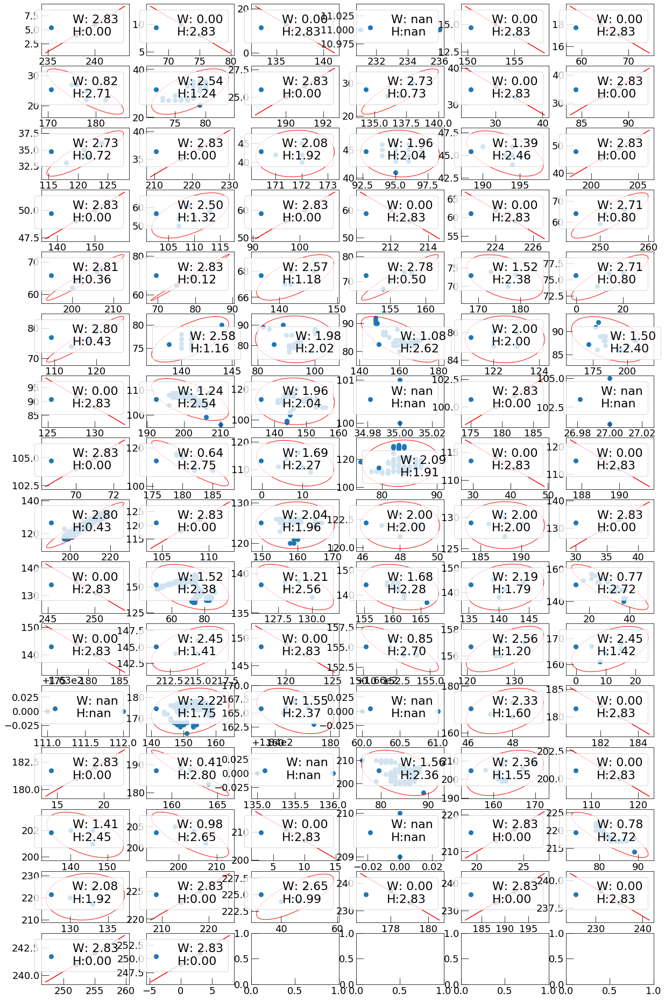

Event: 40
[0, 39, 3, 299.046875, 99.68229166666667, 99, 16, 105, 18, 2.6726124191242437, 0.9258200997725518]


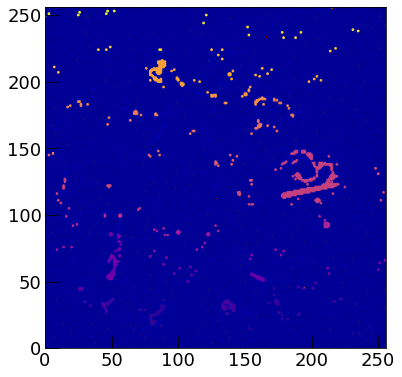

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


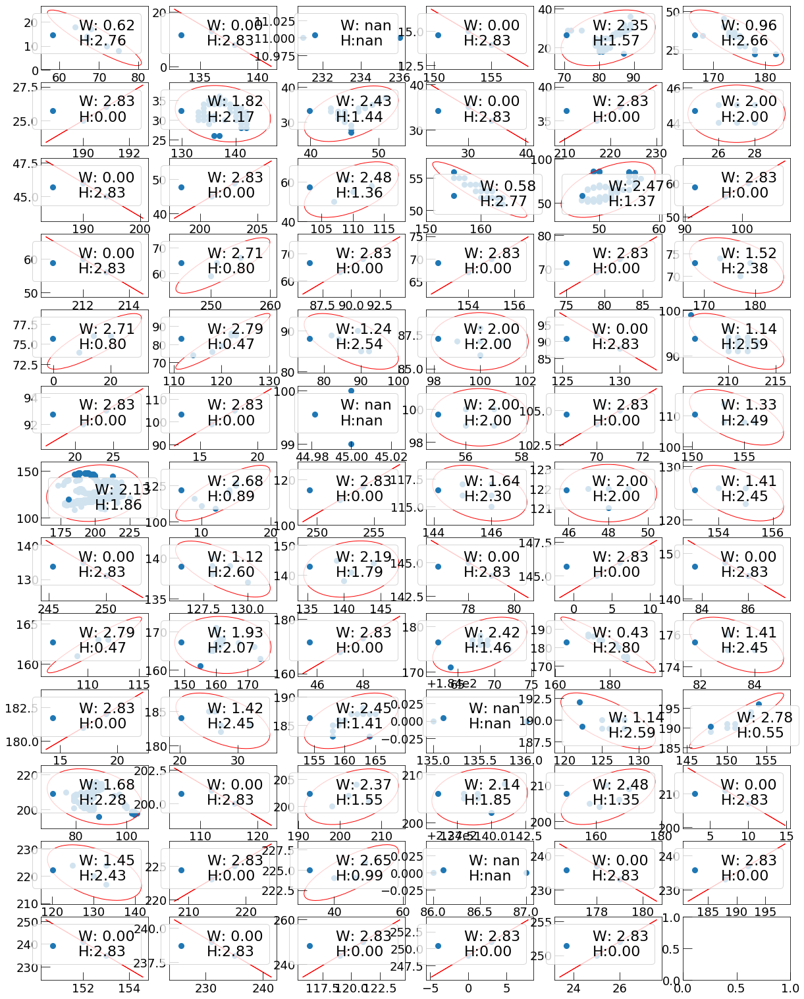

Event: 60
[0, 59, 10, 998.265625, 99.8265625, 155, 100, 170, 100, 2.307331693870654, 1.6359157846478463]


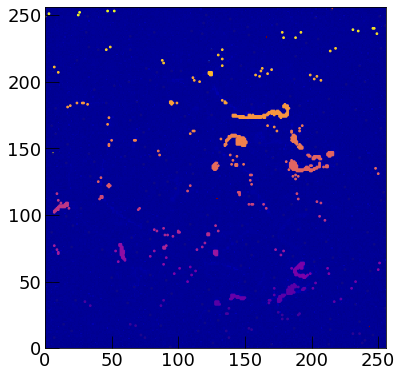

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


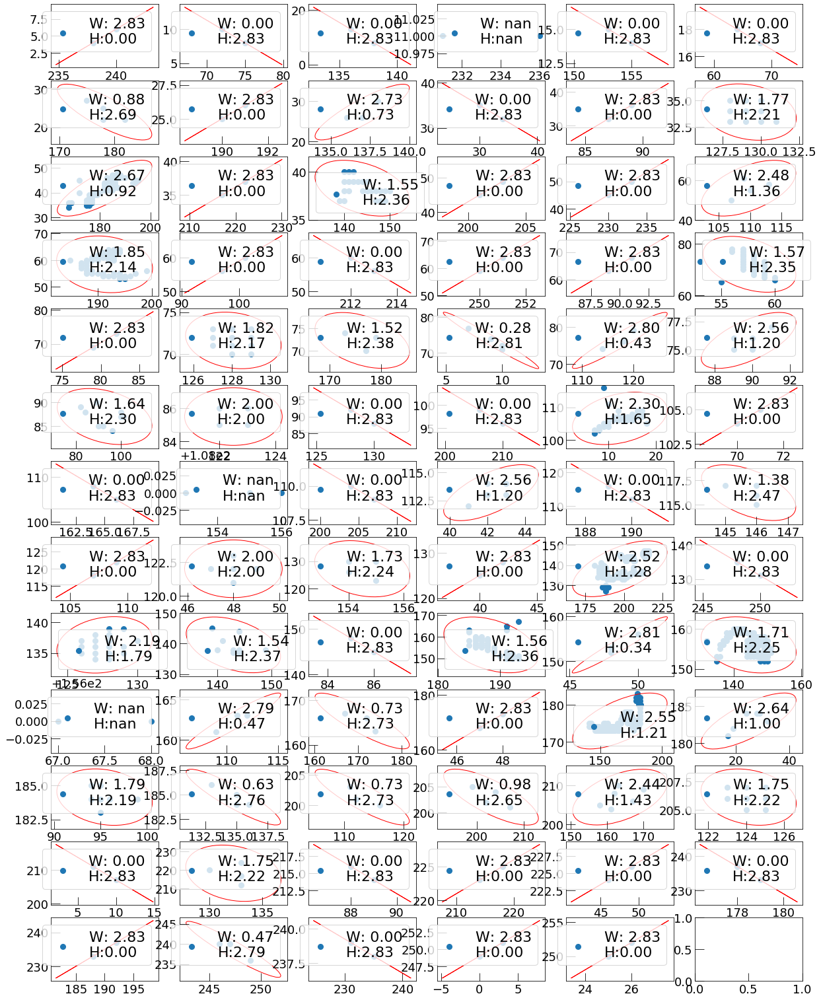

Event: 80
[0, 79, 2, 198.078125, 99.0390625, 223, 214, 225, 218, 2.8284271247461903, 0.0]


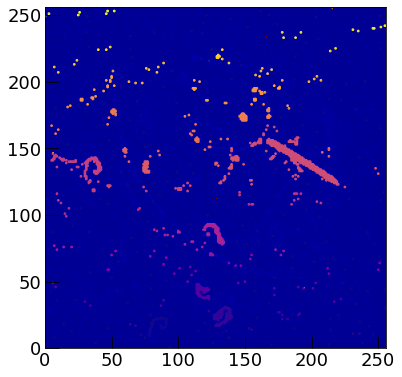

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


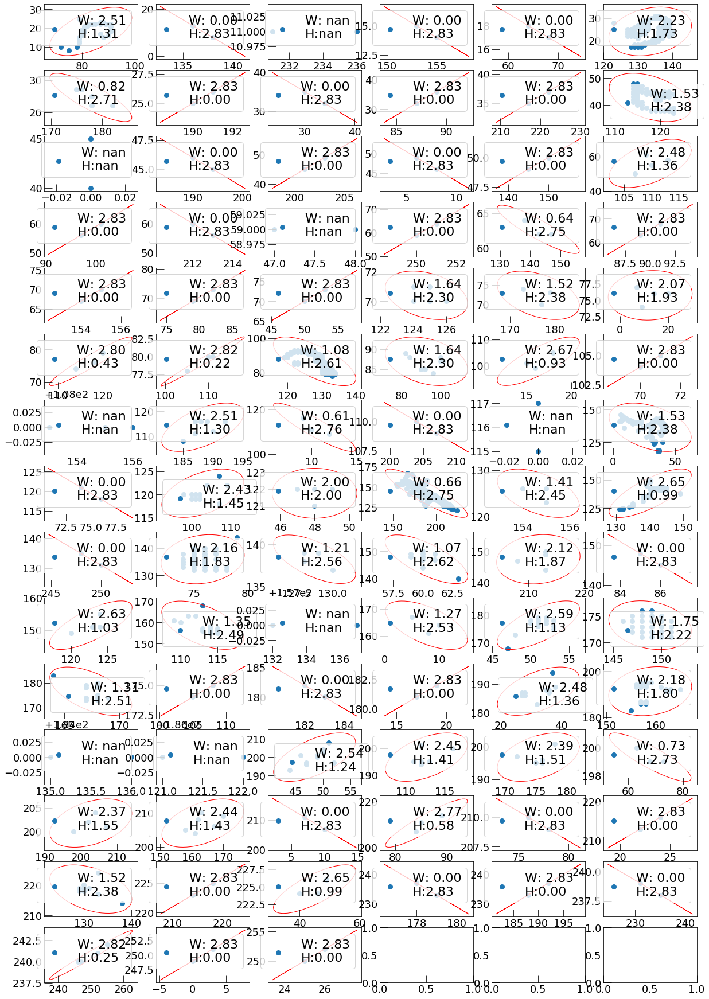

Event: 100
[1, 11, 2, 198.875, 99.4375, 40, 172, 45, 172, -1, -1]


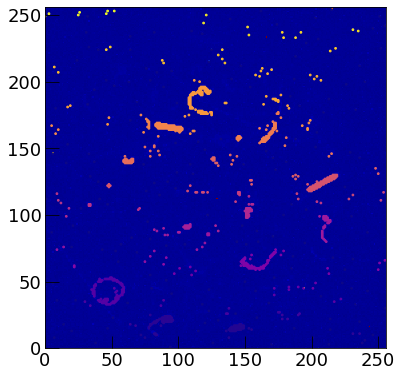

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


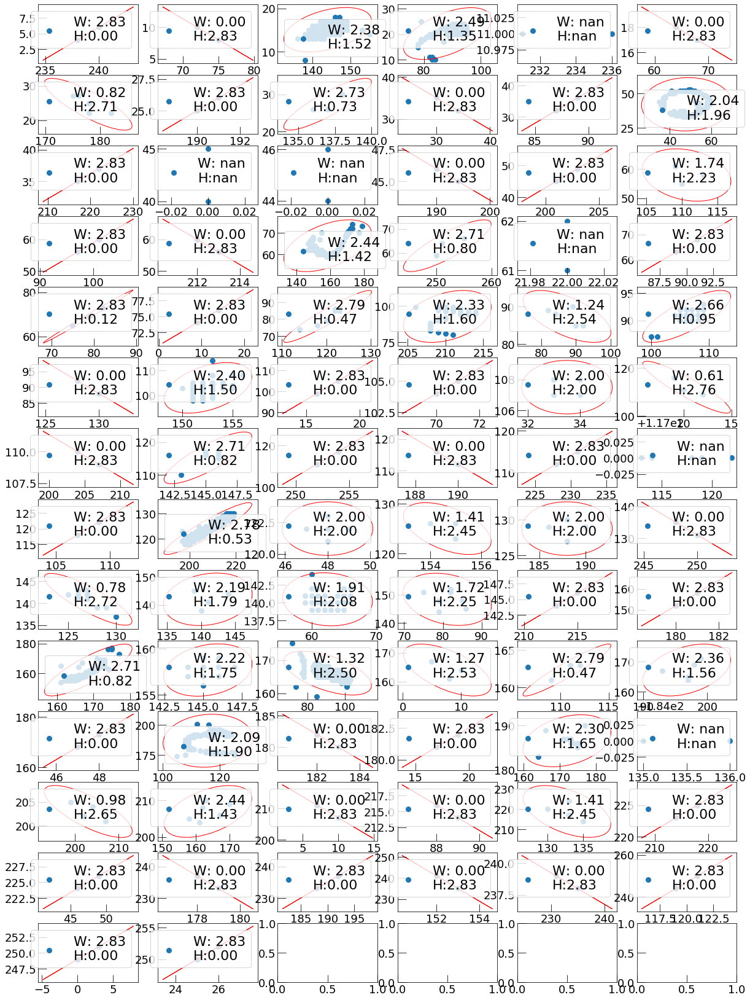

Event: 120
[1, 31, 3, 297.953125, 99.31770833333333, 82, 67, 85, 65, 0.9880709569287939, 2.6502293832937966]


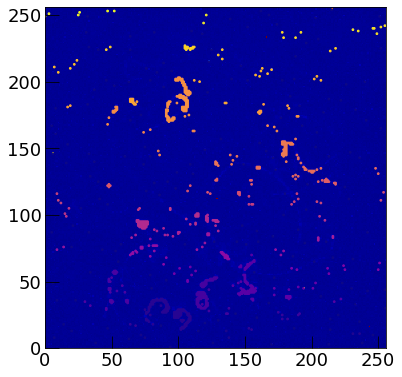

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


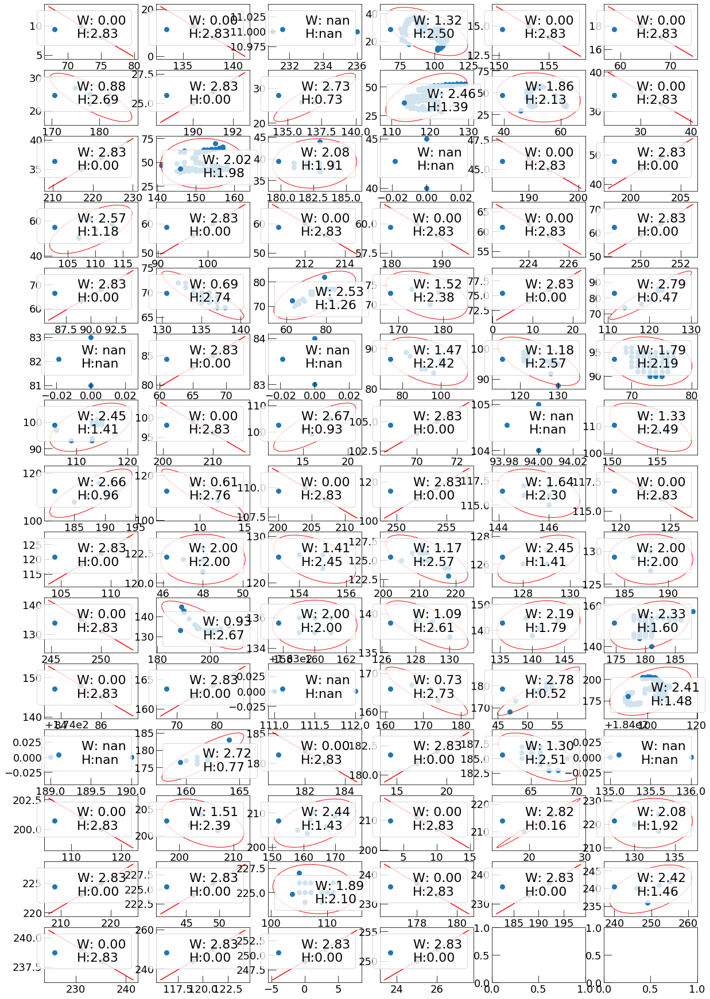

Event: 140
[1, 51, 5, 498.890625, 99.778125, 115, 146, 117, 146, 1.6403330937904184, 2.3041934253477843]


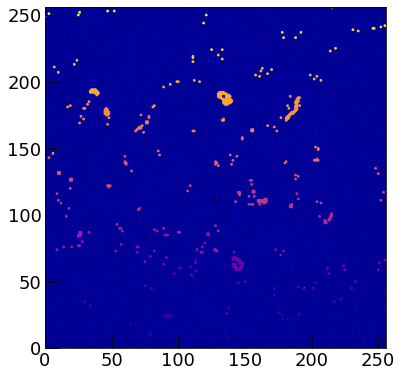

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


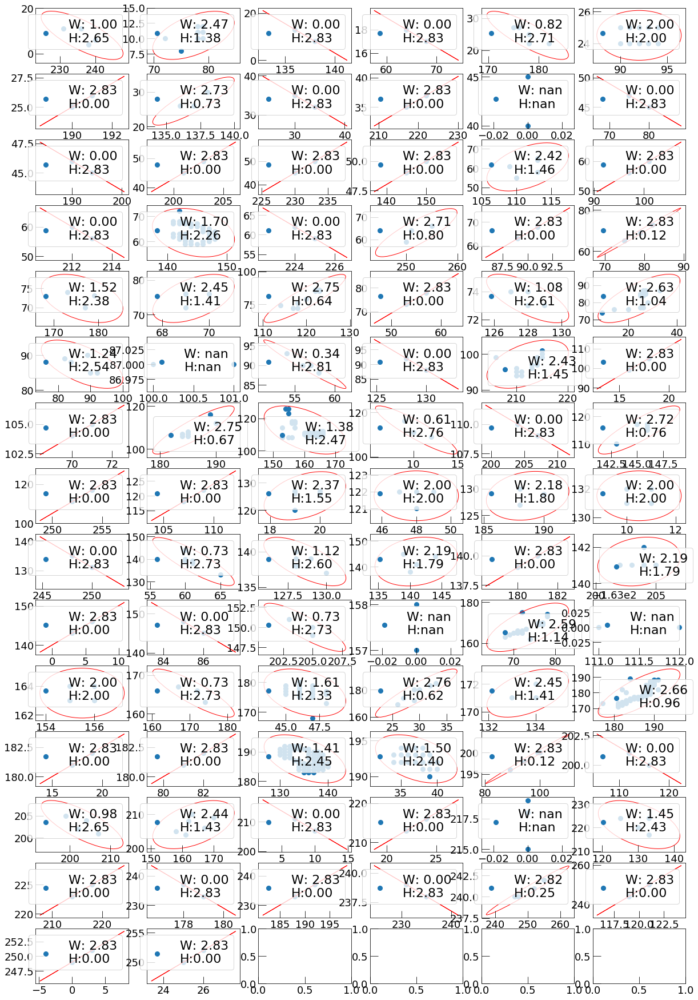

Event: 160
[1, 71, 4, 421.6875, 105.421875, 201, 207, 205, 199, 0.9813121779224049, 2.6527394160492257]


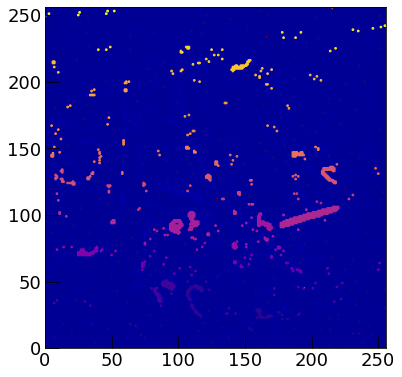

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


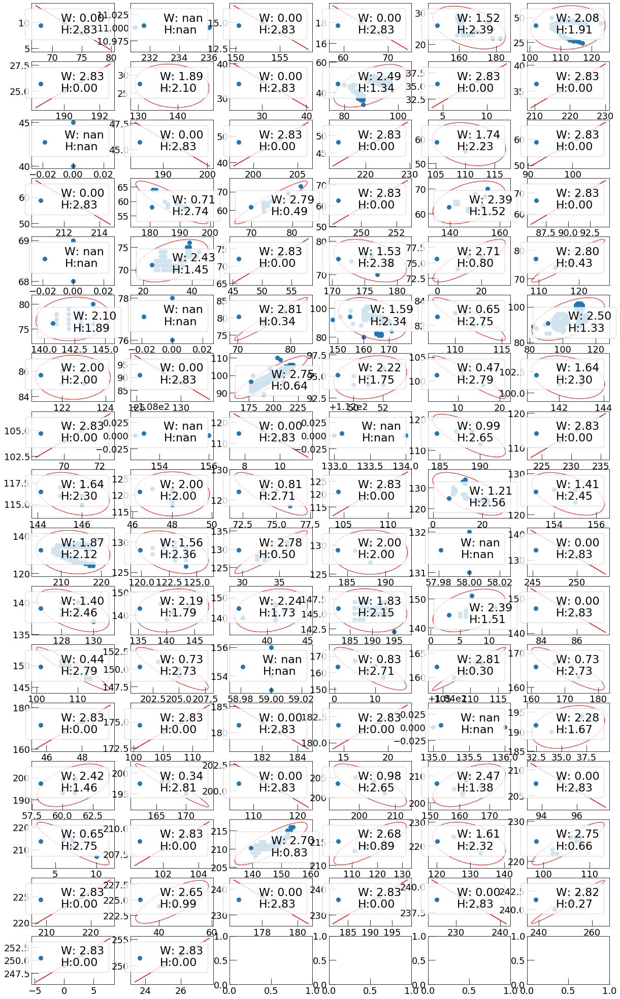

Event: 180
[2, 5, 2, 198.203125, 99.1015625, 14, 155, 15, 153, 0.0, 2.8284271247461903]


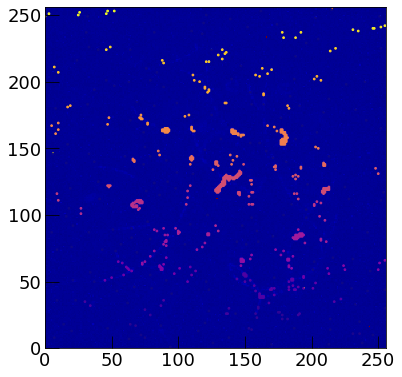

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


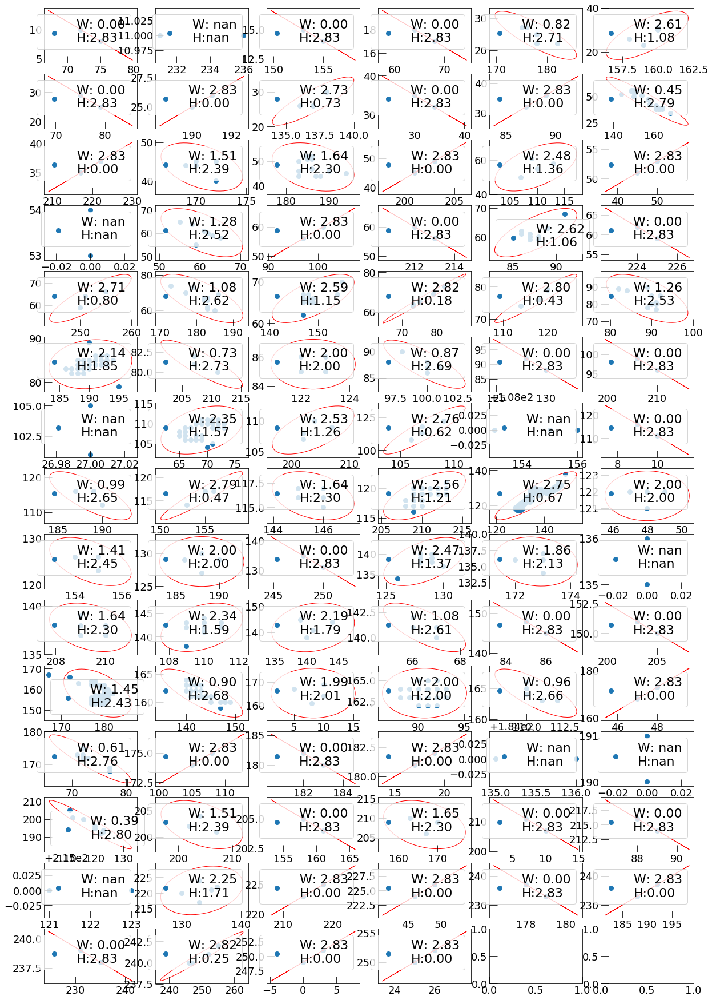

Event: 200
[2, 25, 2, 197.96875, 98.984375, 63, 89, 68, 91, 2.8284271247461903, 0.0]


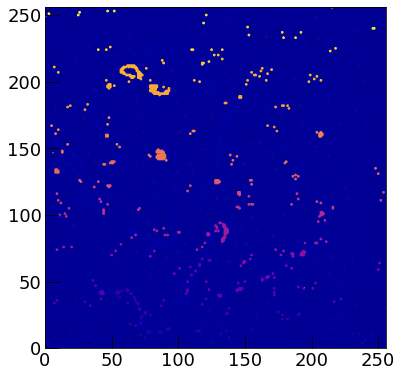

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


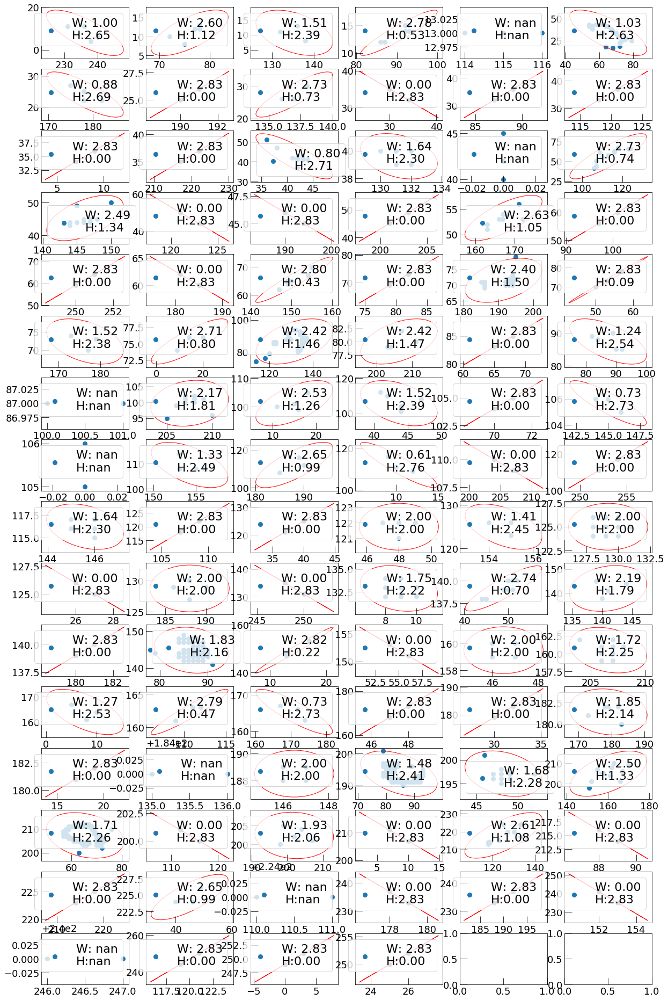

Event: 220
[2, 45, 24, 2387.15625, 99.46484375, 112, 31, 130, 30, 2.1384067173403376, 1.8512743479111144]


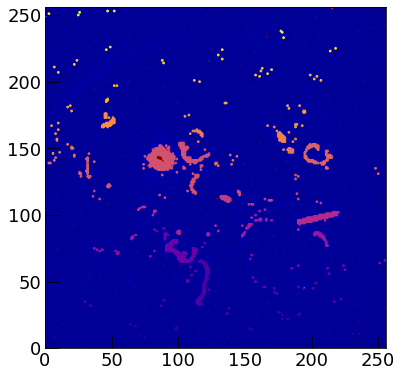

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


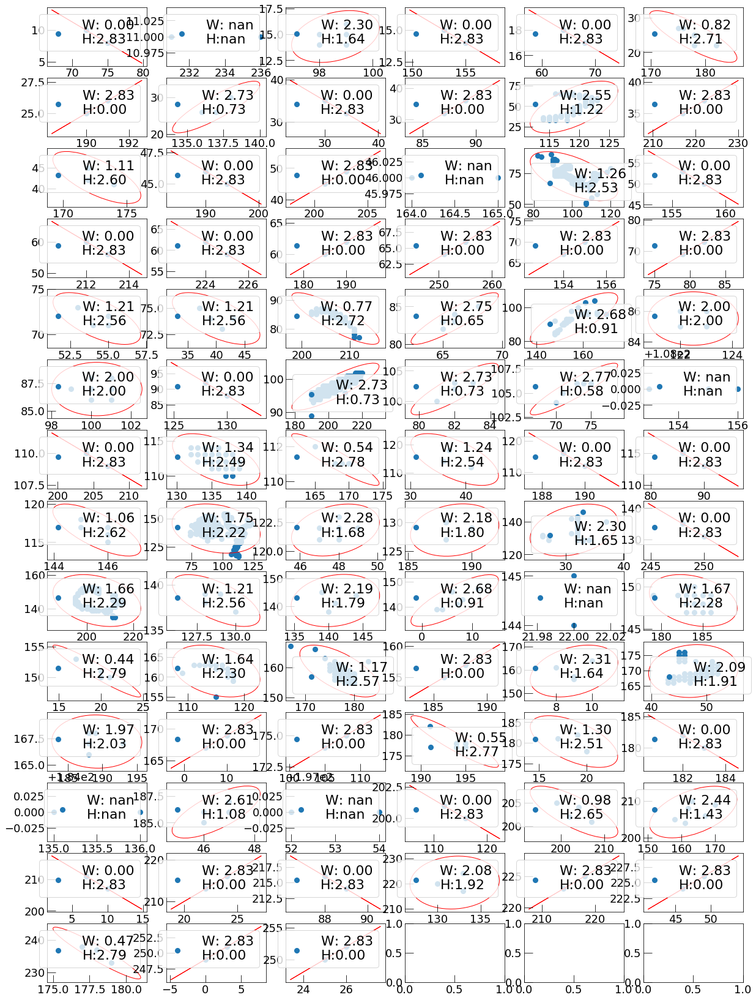

Event: 240
[2, 65, 2, 199.453125, 99.7265625, 168, 47, 173, 48, 2.8284271247461903, 0.0]


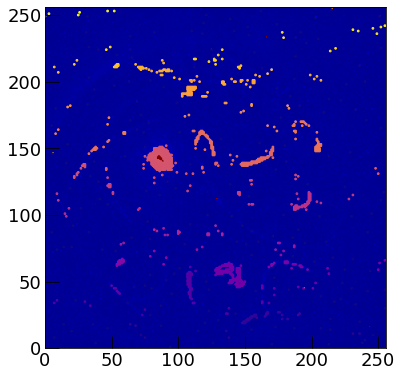

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


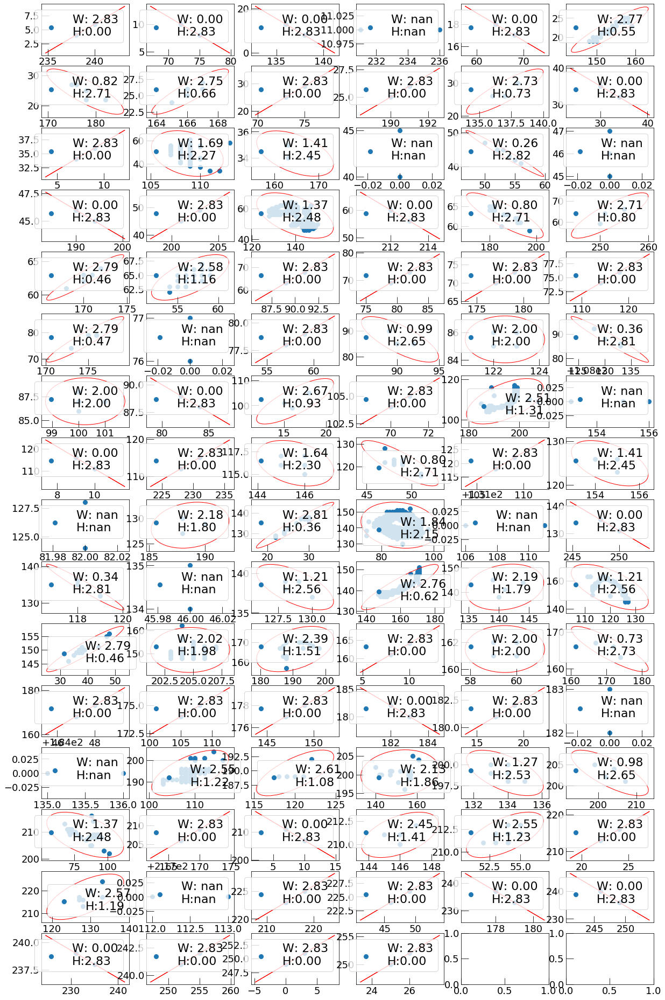

Event: 260
[3, -1, 156, 15532.71875, 99.56870993589743, 1, 94, 254, 215, 1.995632571831284, 2.0043579117128894]


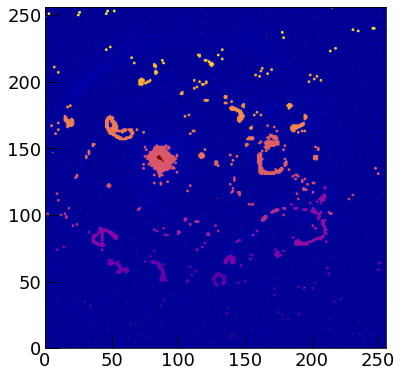

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


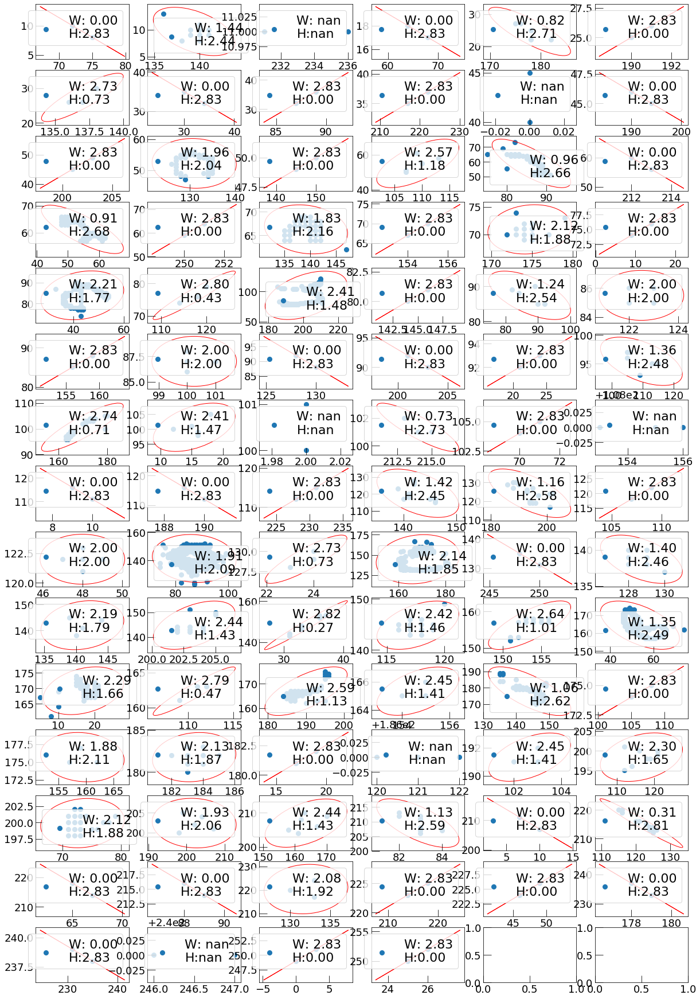

Event: 280
[3, 19, 2, 198.53125, 99.265625, 56, 97, 60, 101, 2.8284271247461903, 0.0]


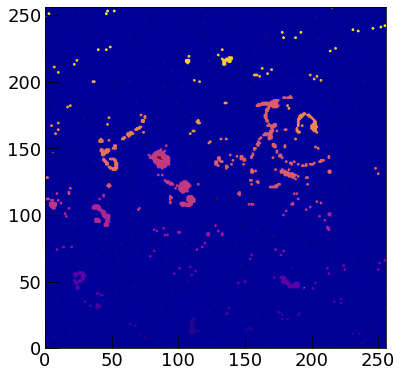

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


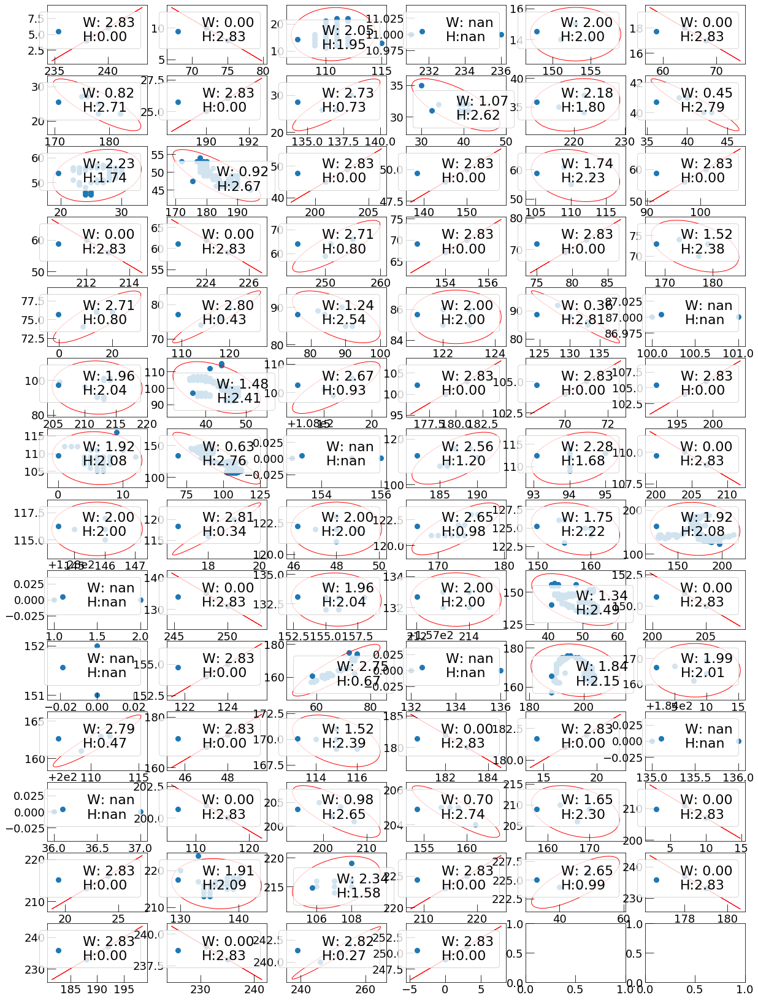

out file ./data/dbscan_run494_cmin_95_cmax_300_rescale_256_rebin_th_image_105_ev_300.txt


In [311]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

max_image=np.size(cy.swift_listdir(cy.file2FullPathCygnus(dataSelection, run, 'H5')))
#max_image = 100
print ("Numbero of immage: %d"% max_image)

data_to_save = []

for iTr in range(0, max_image):

    image = cy.swift_read_image_h5(cy.imageFile2FullPathCygnus(dataSelection, run, iTr))
    rebin_image     = cy.rebin(image, (rescale, rescale))

    edges           = (rebin_image > rebin_th_image) & (rebin_image < cimax)         
    points          = np.array(np.nonzero(edges)).T.astype(float) 
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(points)

    dbscan = DBSCAN(eps=0.1, min_samples = 2) # 4
    dbscan.fit(points)

    clusters = dbscan.fit_predict(X_scaled)

    for i in range (min(dbscan.labels_), max(dbscan.labels_)):
        ph = 0.
        yc = points[:,1][dbscan.labels_==i]
        xc = points[:,0][dbscan.labels_==i]
        for j in range(0, len(xc)):
            x=int(xc[j])
            y=int(yc[j])
            ph += (rebin_image[y,x])
            if j == 0:
                x0start = x
                y0start = y
        x0end = x
        y0end = y
        width, height = confidence_ellipse_par(xc,yc)
        data_to_save.append([iTr, i, np.sum([dbscan.labels_==i]), ph, ph/np.sum([dbscan.labels_==i]), 
                             x0start, y0start, x0end, y0end, width, height])
    if iTr % 20 == 0:
        print ('Event:', iTr)
        print (data_to_save[iTr])
        plt.imshow(rebin_image, vmin=cimin,vmax=cimax, cmap='jet')
        plt.scatter(points[:,1], points[:,0], s=3, c=dbscan.labels_, cmap="plasma")
        plt.xlim(0,rescale)
        plt.ylim(0,rescale)
        plt.show()
        n_cluster = max(dbscan.labels_)
        h_plot    = 6
        l_plot    = math.ceil(n_cluster/h_plot)
        fig, ax   = plt.subplots(l_plot, h_plot , figsize=(20, l_plot*2))
        h_plot_i  = 0
        l_plot_i  = 0
        for ic in range(0, n_cluster):
            el_plt, el_par = confidence_ellipse(points[:,1][dbscan.labels_==ic], points[:,0][dbscan.labels_==ic], 
                                                ax[l_plot_i, h_plot_i], edgecolor='red')
            ax[l_plot_i, h_plot_i].scatter(points[:,1][dbscan.labels_==ic], points[:,0][dbscan.labels_==ic], 
                                           label = ('W: %.2f\nH:%.2f' %(el_par.width,el_par.height)))
            ax[l_plot_i, h_plot_i].legend()
            if (h_plot_i == h_plot - 1):
                h_plot_i = 0
                l_plot_i += 1
            else:
                h_plot_i += 1
        plt.show()
        
        
files = ("./data/dbscan_run%d_cmin_%d_cmax_%d_rescale_%d_rebin_th_image_%d_ev_%d.txt" % 
                 (run, cimin, cimax, rescale, rebin_th_image, max_image))
np.savetxt(files, data_to_save, fmt='%.10e', delimiter=" ")
print ("out file", files)

In [312]:
VarNames=["iTr", "cluster_lable", "pixels", "photons", "ph_pixels", "x0start", "y0start", 
          "x0end", "y0end", "width", "height"]
C_file = './data/dbscan_run1511_cmin_95_cmax_250_rescale_256_rebin_th_image_116_ev_1000.txt' # AmBe 440
# C_file = './data/dbscan_run478_cmin_95_cmax_130_rescale_256.txt' # Co60 ORANGE
#C_file = './data/dbscan_run1514_cmin_95_cmax_250_rescale_256_rebin_th_image_116_ev_100.txt' # AmBe 450
#C_file = './data/dbscan_run725_cmin_95_cmax_130_rescale_256_rebin_th_image_101_ev_100.txt' # Co60 LEMON 450
#C_file = './data/dbscan_run724_cmin_95_cmax_130_rescale_256_rebin_th_image_101_ev_100.txt' #  LEMON 450 senza sorgente
C_file = './data/dbscan_run1514_cmin_95_cmax_300_rescale_256_rebin_th_image_117_ev_100.txt' # AmBe 440
C_file = './data/dbscan_run340_cmin_95_cmax_300_rescale_256_rebin_th_image_101_ev_100.txt' # Fe ORANGE 440
C_file = './data/dbscan_run340_cmin_95_cmax_300_rescale_256_rebin_th_image_101_ev_600.txt' # Fe ORANGE 440
C_file = './data/dbscan_run722_cmin_95_cmax_300_rescale_256_rebin_th_image_101_ev_100.txt' # Co60 ORANGE 440
C_file = './data/dbscan_run494_cmin_95_cmax_300_rescale_256_rebin_th_image_101_ev_300.txt' # AmBe ORANGE 440
C_file = './data/dbscan_run494_cmin_95_cmax_300_rescale_256_rebin_th_image_105_ev_300.txt' # AmBe ORANGE 440

df = pd.read_csv(C_file, sep=" ", dtype='float64', names=VarNames)
# range
# charge distribution
# charge asimettriy
df['length'] = np.sqrt((df['x0end'] - df['x0start'])**2 + (df['y0end'] - df['y0start'])**2)
df['x0c'] = (df['x0end'] + df['x0start'])/2.
df['y0c'] = (df['y0end'] + df['y0start'])/2.

In [313]:
df.head()#[df['cluster_lable']==2]
#df.iloc[:,1:4].head()

,iTr,cluster_lable,pixels,photons,ph_pixels,x0start,y0start,x0end,y0end,width,height,length,x0c,y0c
0,0.0,-1.0,164.0,16344.921875,99.664158,1.0,94.0,254.0,215.0,1.995319,2.004670,280.446073,127.5,154.5
1,0.0,0.0,77.0,7654.781250,99.412744,4.0,103.0,32.0,110.0,2.551010,1.221617,28.861739,18.0,106.5
2,0.0,1.0,2.0,196.656250,98.328125,4.0,238.0,6.0,240.0,2.828427,0.000000,2.828427,5.0,239.0
3,0.0,2.0,2.0,197.343750,98.671875,8.0,75.0,10.0,72.0,0.000000,2.828427,3.605551,9.0,73.5
4,0.0,3.0,2.0,199.000000,99.500000,8.0,138.0,13.0,136.0,0.000000,2.828427,5.385165,10.5,137.0


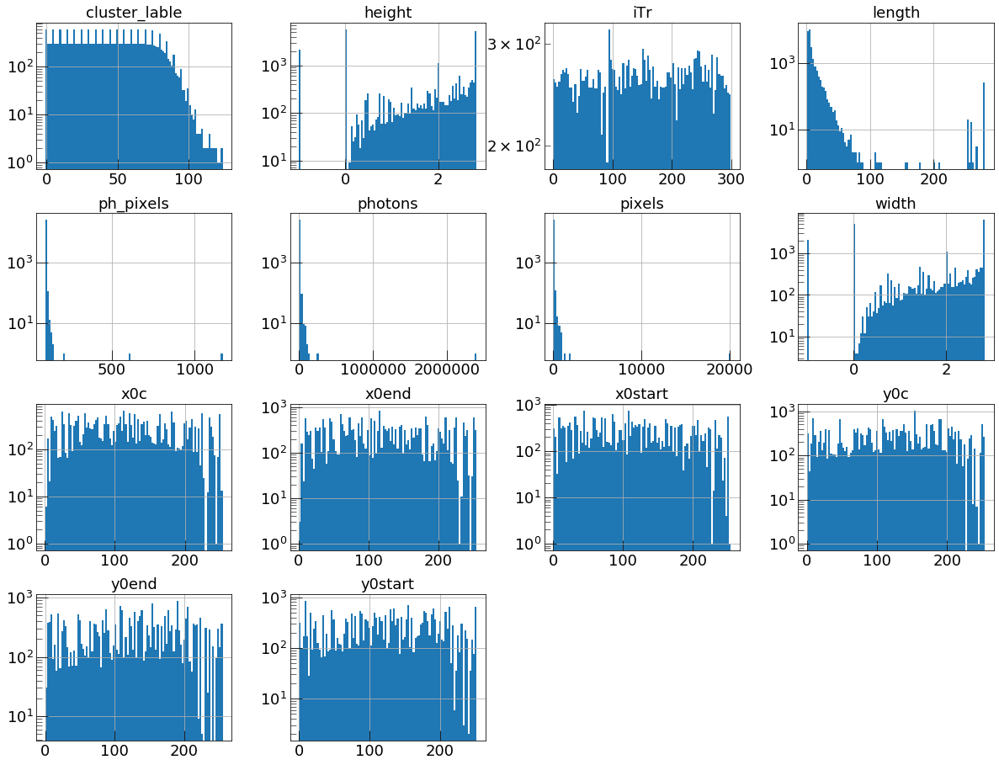

In [314]:
df.hist(bins=100, figsize=(20,15), log=True)
plt.show()

# Custs 

scale 8 0.44
ellisse: 120.00, 100.00 [mm]


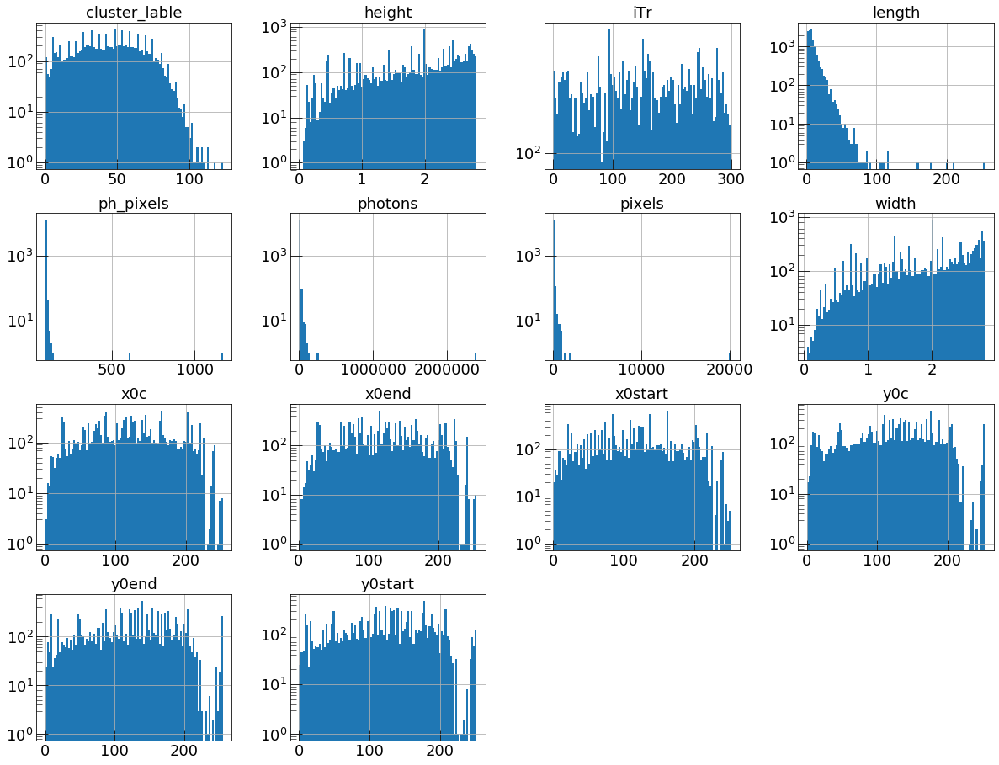

In [315]:

DX = -5
DY = 7
a = 120 # mm
b = 100 # mm
xyscale = x_resolution/rescale
rescale_pixelscale = xyscale*pixelscale

print("scale %d %.2f" % (xyscale,rescale_pixelscale))

print ("ellisse: %.2f, %.2f [mm]" % (a,b))
dfc = df[(df['cluster_lable'] > -1) & (df['width'] > 0) & (df['height'] > 0) ]
#dfc = dfc[(df['x0start'] > 50) & (df['x0end'] < 200) & (df['y0start'] > 50) & (df['y0end'] < 200)]
dfc.hist(bins=100, figsize=(20,15), log=True)
plt.show()



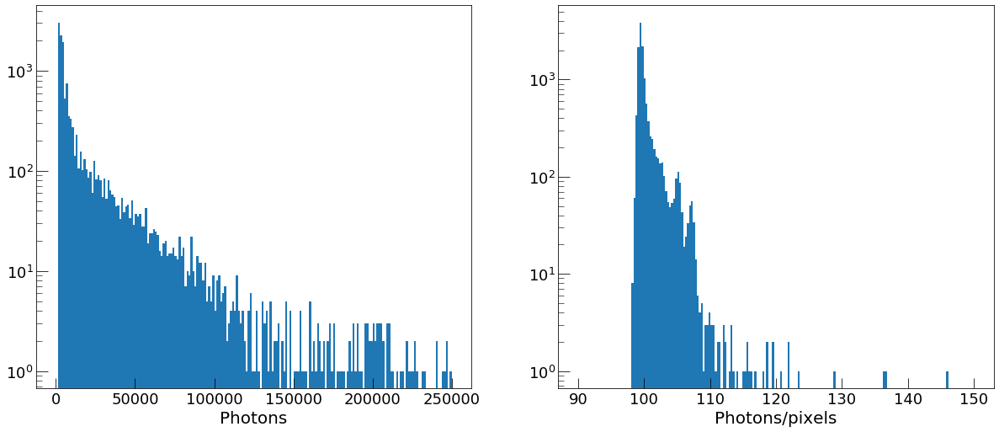

In [325]:
from scipy.optimize import curve_fit
fig, ax = plt.subplots(1,2, figsize=(20, 8))
ax[0].hist(dfc['photons']*xyscale, bins=200, log=True, range=(0, 250000))
ax[0].set_xlabel("Photons")
ax[1].hist(dfc['ph_pixels'], bins=200,log=True, range=(90, 150))
ax[1].set_xlabel("Photons/pixels")
plt.show()

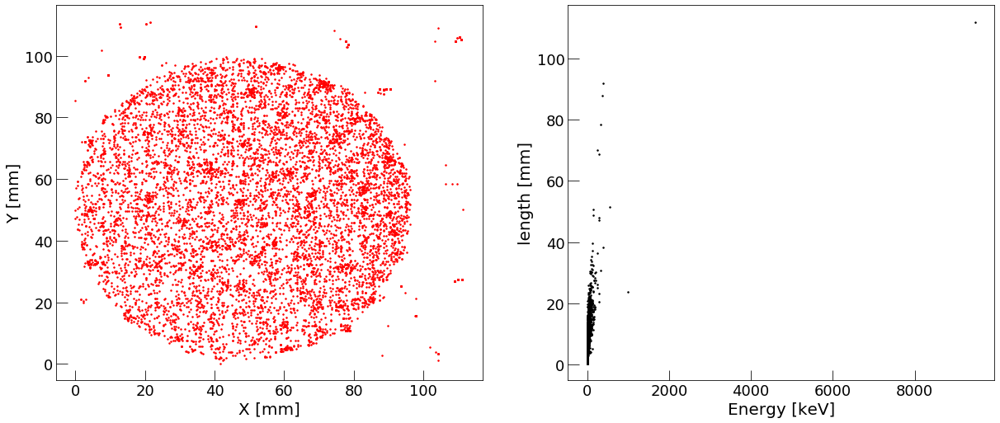

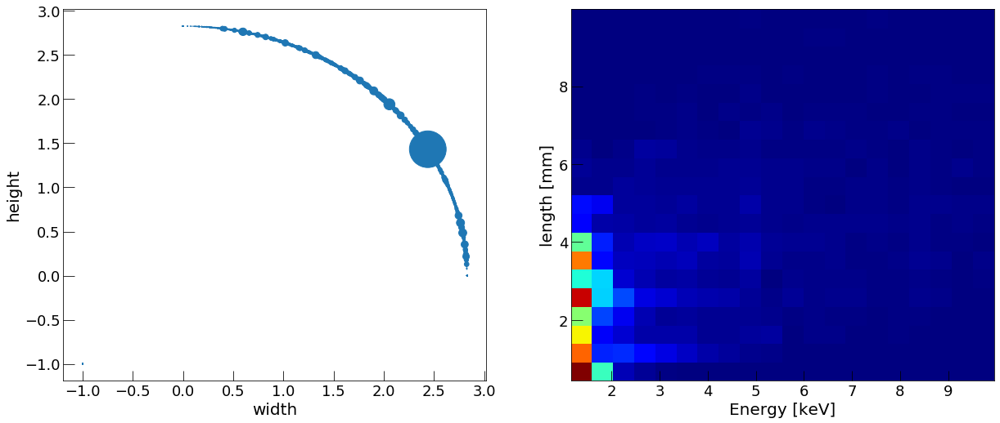

In [317]:
#plt.plot(df['y0start'], df['x0start'], 'k.', markersize=1)
y = dfc['y0c']*rescale_pixelscale
x = dfc['x0c']*rescale_pixelscale
l = dfc['length']*rescale_pixelscale
e = dfc['photons']*xyscale/phKev
fig, ax = plt.subplots(1,2, figsize=(20, 8))
ax[0].plot(y, x, 'r.', markersize=3)
ax[0].set_xlabel("X [mm]")
ax[0].set_ylabel("Y [mm]")
ax[1].plot(e, l, 'k.', markersize=3)
ax[1].set_xlabel("Energy [keV]")
ax[1].set_ylabel("length [mm]")
plt.show()
fig, ax = plt.subplots(1,2, figsize=(20, 8))
ax[0].scatter(df['width'],df['height'],df['pixels']/10 )
ax[0].set_xlabel("width")
ax[0].set_ylabel("height")
#ax[1].plot(e[e<20], l[e<20], 'k.', markersize=5)
ax[1].hist2d(e[(e<10) & (l<10)], l[(e<10) & (l<10)], bins=(20, 20), cmap=plt.cm.jet)
ax[1].set_xlabel("Energy [keV]")
ax[1].set_ylabel("length [mm]")
plt.show()

In [318]:
VarNames=["iTr", "cluster_lable", "pixels", "photons", "ph_pixels", "x0start", "y0start", 
          "x0end", "y0end", "width", "height"]
#######################
#C_file = './data/dbscan_run1514_cmin_95_cmax_300_rescale_256_rebin_th_image_116_ev_100.txt' # AmBe 450
#C_file = './data/dbscan_run1514_cmin_95_cmax_300_rescale_256_rebin_th_image_117_ev_100.txt' # AmBe 450
#C_file = './data/dbscan_run1514_cmin_95_cmax_300_rescale_256_rebin_th_image_120_ev_100.txt' # AmBe 450
C_file = './data/dbscan_run494_cmin_95_cmax_300_rescale_256_rebin_th_image_101_ev_300.txt' # AmBe ORANGE 440
C_file = './data/dbscan_run494_cmin_95_cmax_300_rescale_256_rebin_th_image_105_ev_300.txt' # AmBe ORANGE 440
ambe = pd.read_csv(C_file, sep=" ", dtype='float64', names=VarNames)
########################
C_file = './data/dbscan_run725_cmin_95_cmax_300_rescale_256_rebin_th_image_101_ev_100.txt' # Co60 LEMON 450
C_file = './data/dbscan_run722_cmin_95_cmax_300_rescale_256_rebin_th_image_101_ev_100.txt' # Co60 ORANGE 440
co60 = pd.read_csv(C_file, sep=" ", dtype='float64', names=VarNames)
ambe['length'] = np.sqrt((ambe['x0end'] - ambe['x0start'])**2 + (ambe['y0end'] - ambe['y0start'])**2)
co60['length'] = np.sqrt((co60['x0end'] - co60['x0start'])**2 + (co60['y0end'] - co60['y0start'])**2)
ambe = ambe[(ambe['cluster_lable'] > -1) & (ambe['width'] > 0) & (ambe['height'] > 0) ]
co60 = co60[(co60['cluster_lable'] > -1) & (co60['width'] > 0) & (co60['height'] > 0) ]


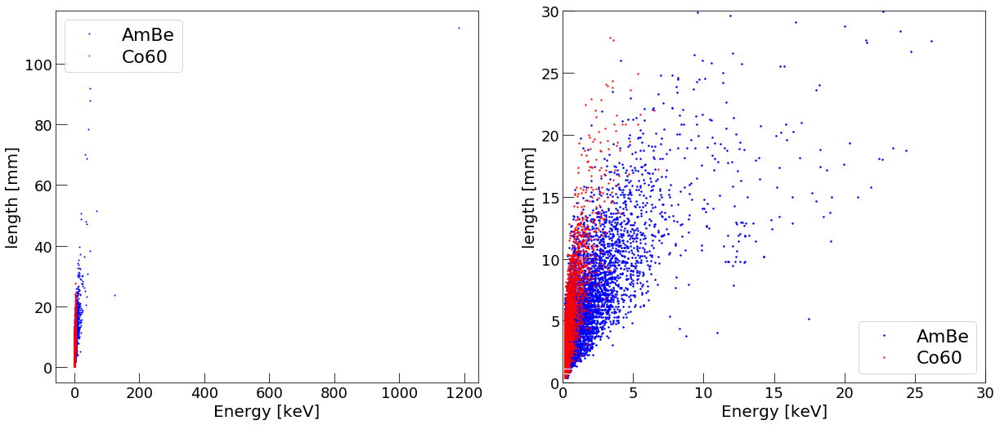

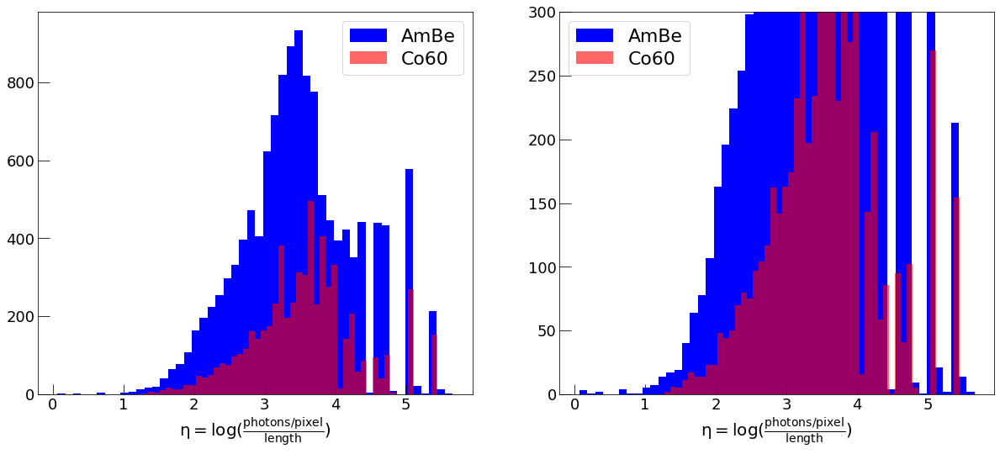

In [322]:
fig, ax = plt.subplots(1,2, figsize=(20, 8))
ax[0].plot(ambe['photons']/phKev, ambe['length']*rescale_pixelscale, 'b.', markersize=2, label='AmBe')
ax[0].plot(co60['photons']/phKev, co60['length']*rescale_pixelscale, 'r.', markersize=2, alpha=0.8, label='Co60')
ax[1].plot(ambe['photons']/phKev, ambe['length']*rescale_pixelscale, 'b.', markersize=3, label='AmBe')
ax[1].plot(co60['photons']/phKev, co60['length']*rescale_pixelscale, 'r.', markersize=3, alpha=0.8, label='Co60')

#plt.plot(cosmic['photons']/phKev, cosmic['length']*rescale_pixelscale, 'g.', markersize=2, alpha=0.4)

ax[0].set_xlabel("Energy [keV]")
ax[0].set_ylabel("length [mm]")
ax[1].set_xlabel("Energy [keV]")
ax[1].set_ylabel("length [mm]")

ax[1].set_xlim(0,30)
ax[1].set_ylim(0,30)
ax[0].legend()
ax[1].legend()

plt.show()
fig, ax = plt.subplots(1,2, figsize=(20, 8))

#ax[0].hist(ambe['length']*rescale_pixelscale, bins=100, color='b')
#ax[0].hist(co60['length']*rescale_pixelscale, bins=100, color='r', alpha=0.6)
ax[0].hist(np.log(ambe['ph_pixels']/(ambe['length'][ambe['length']>0]*rescale_pixelscale)), bins=50,
           color='b', label='AmBe')
ax[0].hist(np.log(co60['ph_pixels']/(co60['length'][co60['length']>0]*rescale_pixelscale)), bins=50, 
           color='r', alpha=0.6, label='Co60')


ax[1].hist(np.log(ambe['ph_pixels']/(ambe['length'][ambe['length']>0]*rescale_pixelscale)), bins=50, 
           color='b', label='AmBe')
ax[1].hist(np.log(co60['ph_pixels']/(co60['length'][co60['length']>0]*rescale_pixelscale)), bins=50, 
           color='r', alpha=0.6, label='Co60')
#ax[0].set_ylabel("counts")
ax[0].set_xlabel(r"$\eta = log (\frac {photons/pixel} {length})$")
ax[1].set_xlabel(r"$\eta = log (\frac {photons/pixel} {length})$")

#ax[1].set_xlim(0,50)
ax[1].set_ylim(0,300)
ax[0].legend()
ax[1].legend()
plt.show()


In [320]:
ambe_h, ambe_bins = np.histogram(np.log(ambe['ph_pixels']/(ambe['length'][ambe['length']>0]*rescale_pixelscale)), 
                            bins=24, range=(0,6))
co60_h, co60_bins = np.histogram(np.log(co60['ph_pixels']/(co60['length'][co60['length']>0]*rescale_pixelscale)), 
                            bins=24, range=(0,6))

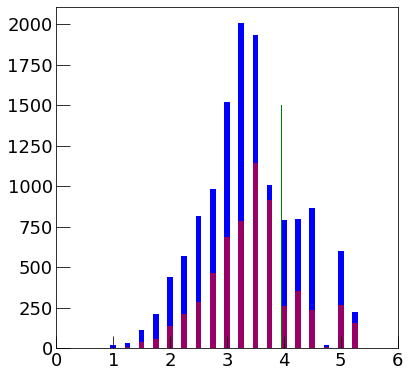

In [321]:
plt.bar(ambe_bins[:-1], ambe_h, width=0.1, color='b')
plt.bar(co60_bins[:-1], co60_h, width=0.1, color='r', alpha=0.6)
plt.plot((3.95, 3.95), (0,1500), 'g')
plt.xlim(0,6)
plt.show()

In [655]:
co60_bins[:-1][co60_h==0]

array([4.75, 5.  , 5.25, 5.5 , 5.75])

In [656]:
co60_bins

array([0.  , 0.25, 0.5 , 0.75, 1.  , 1.25, 1.5 , 1.75, 2.  , 2.25, 2.5 ,
       2.75, 3.  , 3.25, 3.5 , 3.75, 4.  , 4.25, 4.5 , 4.75, 5.  , 5.25,
       5.5 , 5.75, 6.  ])

In [698]:
#np.where(co60_bins==3.95)[0][0]
print("Contminazione: ", co60_h[co60_bins[:-1]>3.95].sum()/ambe_h[ambe_bins[:-1]>3.95].sum())

Contminazione:  0.11814214463840399


In [667]:
co60_h_cut=np.copy(co60_h)
co60_h_cut[co60_bins[:-1]>3.95]=0

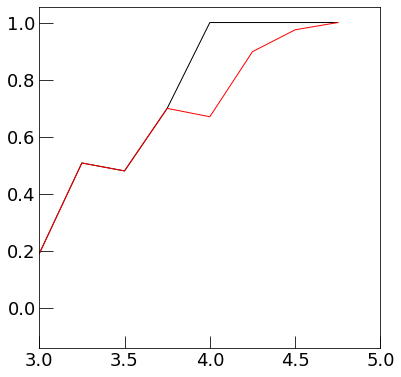

In [678]:
detec_eff = (ambe_h[ambe_h>0]-co60_h[ambe_h>0])/ambe_h[ambe_h>0]
detec_eff_cut = (ambe_h[ambe_h>0]-co60_h_cut[ambe_h>0])/ambe_h[ambe_h>0]

detec_bins = ambe_bins[:-1][ambe_h>0]
plt.plot(detec_bins, detec_eff_cut, color='k')
plt.plot(detec_bins, detec_eff, color='r')
plt.xlim(3,5)
plt.show()

In [598]:
len(detec_eff)

91

In [646]:
np.exp(3.95)

51.93536683483144

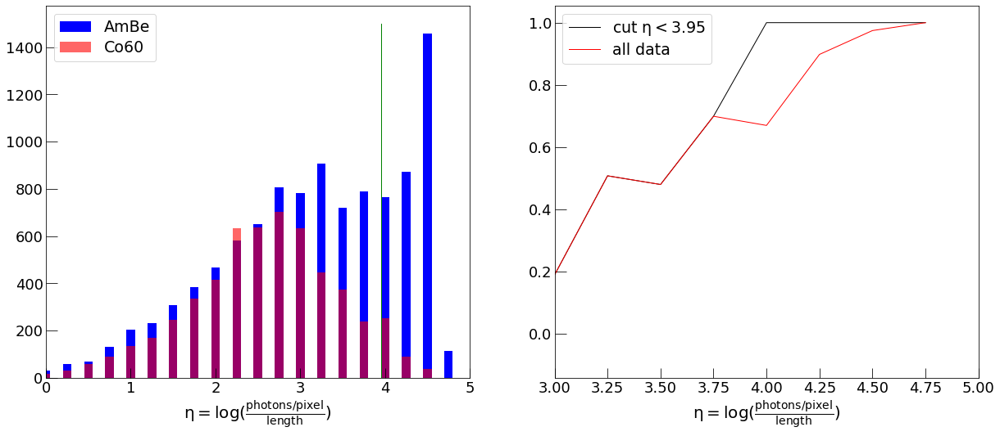

In [687]:
fig, ax = plt.subplots(1,2, figsize=(20, 8))
ax[0].bar(ambe_bins[:-1], ambe_h, width=0.1, color='b', label='AmBe')
ax[0].bar(co60_bins[:-1], co60_h, width=0.1, color='r', alpha=0.6, label='Co60')
ax[0].plot((3.95, 3.95), (0,1500), 'g')
ax[0].set_xlim(0,5)
ax[0].legend()
ax[1].plot(detec_bins, detec_eff_cut, color='k', label=r'cut $\eta < 3.95$')
ax[1].plot(detec_bins, detec_eff, color='r', label='all data')
ax[1].set_xlim(3,5)
ax[1].legend()
ax[0].set_xlabel(r"$\eta = log (\frac {photons/pixel} {length})$")
ax[1].set_xlabel(r"$\eta = log (\frac {photons/pixel} {length})$")
plt.show()

In [702]:
d = np.linspace(0, 80, 80)
lenght = d/np.exp(3.95)

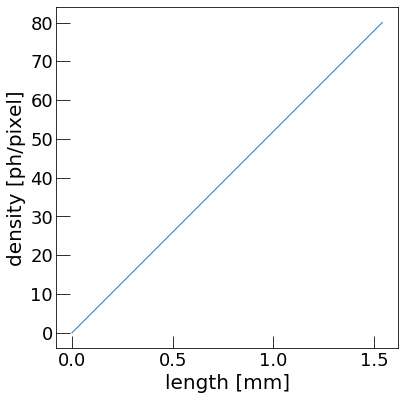

In [703]:
plt.plot(lenght, d)
plt.xlabel(r"length [mm]")
plt.ylabel(r"density [ph/pixel]")
plt.show()